# Timeseries exploration

In [2]:
import pandas as pd
import numpy as np
import matplotlib as mlp
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm

In [4]:
import torch

ModuleNotFoundError: No module named 'torch'

# Patients metadata
Contains target variable as well personal data - age, sex.

We have 190 samples - 90 healthy + 100 patients.

In [2]:
df_patients = pd.read_csv('patients-metadata.csv')

In [3]:
df_patients.shape

(190, 4)

In [4]:
df_patients.columns

Index(['folder', 'personal code (Hydra ID)', 'age', 'sex (1=M)'], dtype='object')

In [5]:
df_patients['folder']

0      ESO_C10006_20100723_1339_1
1      ESO_C10013_20100715_1534_1
2      ESO_C10015_20100809_0819_1
3      ESO_C10017_20100716_1530_1
4      ESO_C10018_20100719_1605_1
                  ...            
185    ESO_P00176_20140814_1124_1
186    ESO_P00177_20140811_1253_1
187    ESO_P00178_20140811_1557_1
188    ESO_P00180_20140922_1207_1
189    ESO_P00205_20140908_1546_1
Name: folder, Length: 190, dtype: object

In [6]:
df_patients['target'] = df_patients.apply(lambda x: 1 if x.folder.startswith('ESO_P') else 0, axis=1)

In [7]:
df_patients['target'].value_counts()

1    100
0     90
Name: target, dtype: int64

In [8]:
df_patients.drop(columns=['folder', 'personal code (Hydra ID)'], inplace=True)

In [9]:
df_patients.rename({'sex (1=M)' : 'sex'}, axis=1, inplace=True)

In [10]:
df_patients.sex = df_patients.sex - 1

In [11]:
df_patients.head()

,age,sex,target
0,24.750,1,0
1,27.667,1,0
2,34.167,1,0
3,28.917,1,0
4,31.917,0,0


In [92]:
df_patients.to_csv('patients-cleaned.csv')
%store df_patients

Stored 'df_patients' (DataFrame)


# Timeseries data

For each patient one timeserie per brain region is available.

That means we have 90 regions, each has 400 long timeserie (sampling rate???) per subject.

In [12]:
import scipy.io
matlab_file = scipy.io.loadmat('eso190_aal_strin_090_avg.mat')

In [13]:
np_timeseries = matlab_file['subj_tcs']

In [14]:
np_timeseries.shape

(400, 90, 190)

In [15]:
np_timeseries = np_timeseries.transpose(2, 1, 0)
np_timeseries.shape

(190, 90, 400)

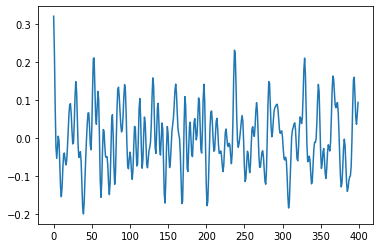

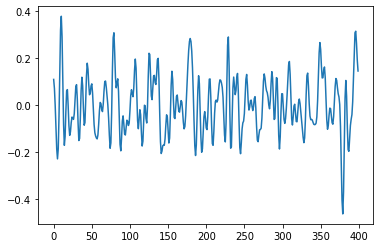

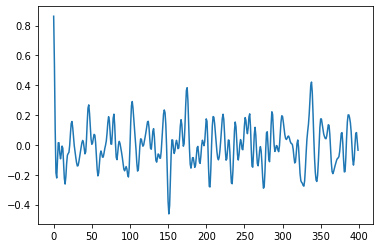

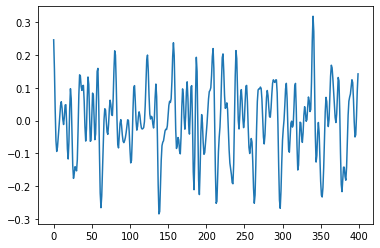

In [16]:
# Check the timeseries for 2 H + 2 P.
for i in [0,1, 90,91]:
    plt.plot(range(400), np_timeseries[i,0,:])
    plt.show()

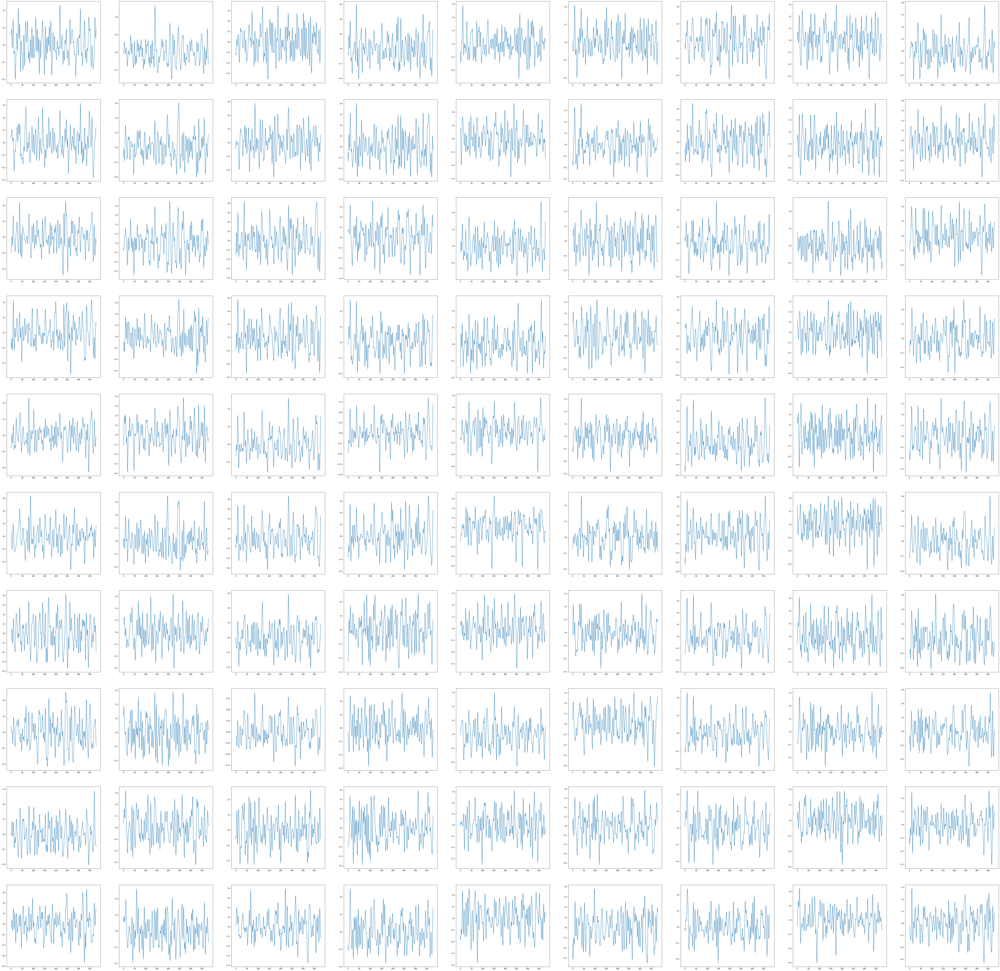

In [43]:
# Check the timeseries for single subject.
fig, ax = plt.subplots(nrows=10, ncols=9, figsize=(100, 100))

for i in range(10):
    for j in range(9):
        ax[i][j].plot(range(380), np_timeseries_20[0,j*10+i,:])
plt.show()

In [17]:
total_samples, total_regions, total_time = np_timeseries.shape

In [18]:
print('Subjects: ', total_samples)
print('Brain regions: ', total_regions)
print('Timeseries length: ', total_time)

Subjects:  190
Brain regions:  90
Timeseries length:  400


In [90]:
%store np_timeseries

Stored 'np_timeseries' (ndarray)


## Different timeseries transformations

In [75]:
def cut_signal(signal, start, end=None):
    return signal[start:] if end is None else signal[start:-end]

def denormalize_signal(signal):
    return (signal - np.mean(signal)) / np.std(signal)

def power_signal(signal, power):
    return np.power(signal, power)

def log_signal(signal):
    return np.log(np.abs(signal))

def absolute_signal(signal):
    return np.abs(signal)

def positive_signal(signal):
    return signal - np.min(signal)

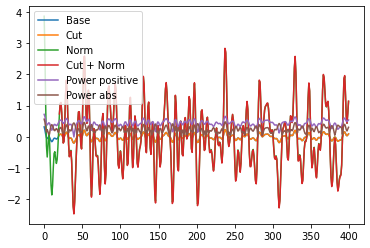

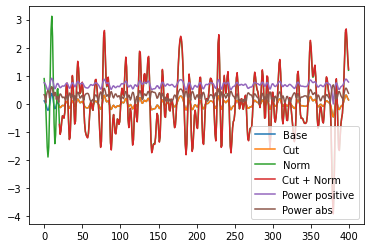

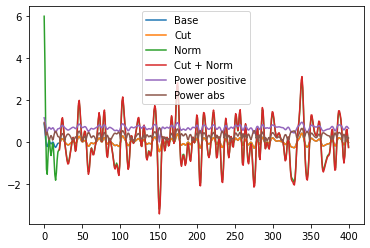

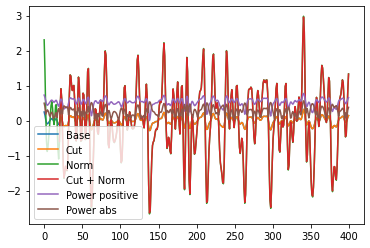

In [81]:
# Check the timeseries for 2 H + 2 P.
for i in [0,1, 90,91]:
    plt.plot(range(total_time), np_timeseries[i,0,:], label='Base')
    
    plt.plot(range(20, total_time), cut_signal(np_timeseries[i,0,:], start=20), label='Cut')

    plt.plot(range(total_time), denormalize_signal(np_timeseries[i,0,:]), label='Norm')
    plt.plot(range(20, total_time), denormalize_signal(cut_signal(np_timeseries[i,0,:], start=20)), label='Cut + Norm')

    plt.plot(range(total_time), power_signal(positive_signal(np_timeseries[i,0,:]), power=0.5), label='Power positive')
    plt.plot(range(total_time), power_signal(absolute_signal(np_timeseries[i,0,:]), power=0.5), label='Power abs')

    plt.legend()
    plt.show()

In [40]:
np_timeseries_20 = np_timeseries[:,:,20:]

In [41]:
np_timeseries_20.shape

(190, 90, 380)

### Granger causality test

In [93]:
p_001 = np_timeseries[0,:,:]

In [94]:
gc = sm.tsa.stattools.grangercausalitytests(p_001[1:3,:].T,10)


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0641  , p=0.8003  , df_denom=396, df_num=1
ssr based chi2 test:   chi2=0.0645  , p=0.7995  , df=1
likelihood ratio test: chi2=0.0645  , p=0.7995  , df=1
parameter F test:         F=0.0641  , p=0.8003  , df_denom=396, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.7465  , p=0.0654  , df_denom=393, df_num=2
ssr based chi2 test:   chi2=5.5629  , p=0.0619  , df=2
likelihood ratio test: chi2=5.5244  , p=0.0632  , df=2
parameter F test:         F=2.7465  , p=0.0654  , df_denom=393, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.3077  , p=0.2715  , df_denom=390, df_num=3
ssr based chi2 test:   chi2=3.9936  , p=0.2622  , df=3
likelihood ratio test: chi2=3.9737  , p=0.2643  , df=3
parameter F test:         F=1.3077  , p=0.2715  , df_denom=390, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.4413  , p=0.2196  

In [103]:
gc[1][0]['ssr_ftest'][1]

0.8003313447544244

### Correlations

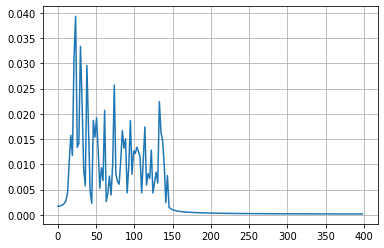

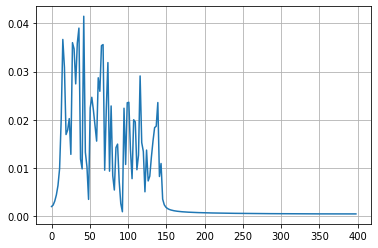

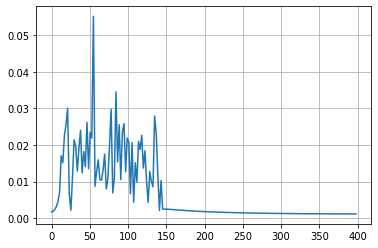

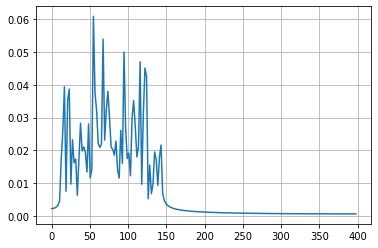

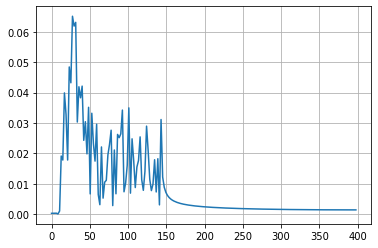

...

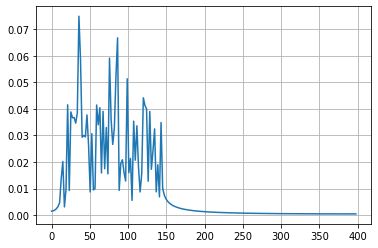

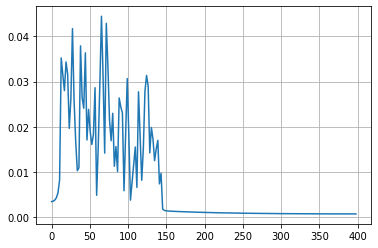

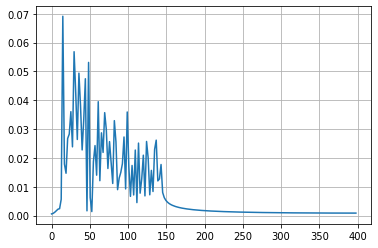

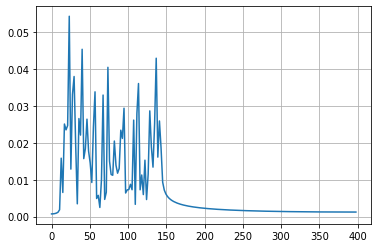

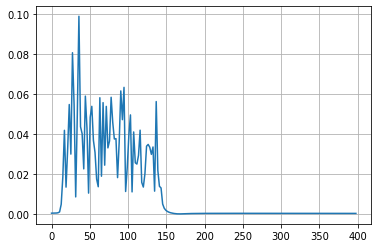

In [89]:
# Number of sample points
N = 380
# sample spacing
T = 1.0 / 800.0

for p in range(total_samples):
    x = np.linspace(0.0, N*T, N, endpoint=False)
    y = cut_signal(np_timeseries[p,0,:], start=20)
    yf = scipy.fft.fft(y)
    xf = scipy.fft.fftfreq(N, T)[:N//2]
    plt.plot(xf, 2.0/N * np.abs(yf[0:N//2]))
    plt.grid()
    plt.show()